## Chapter 01: Log-Linear Model


### 1. Introduction

Solomon and Wynne conducted an experiment on Dogs in 1953 . They wanted to understand, whether Dogs can learn from mistakes, so to speak. Specifically, They were interested in _avoidance-learning_. That is, when Dogs are given trauma-inducing shocks, will they learn to avoid shocks in future?

We can state the objectives of the expeirment, according to our understanding, in more general terms as follows:

1. Can the Dogs learn?
2. Can they retain & recollect what they learnt?

The experimental setup, to drive the objectives, holds a dog in a closed compartment with steel flooring, open on one side with a small barrier for dog to jump over to the other side. A high-voltage electric shock is discharged into the steel floor intermittently to stimulate the dog. The dog is then left with an option to either get the shock for that trial or jump over the barrier to other side & save himself. Several dogs were recruited in the experiment.

The following picture ([source](https://commons.wikimedia.org/wiki/File:Shuttle_Box_Dog_Orange.png)) is an illustration of the setup.
<br>
<br>
![dog_setup](./data/avoidance_learning.png)
<br>
<br>
More details of the experiment can be found [here](http://www.appstate.edu/~steelekm/classes/psy5300/Documents/Solomon&Wynne%201953.pdf).

<br>
<br>

In this chapter, we will analyze the experimental data using _Bayesian Analysis_, and the inference will be carried out in `Pyro`. The organization of the notebook is inspired from [Bayesian Workflow](http://www.stat.columbia.edu/~gelman/research/unpublished/Bayesian_Workflow_article.pdf) by Prof. Andrew Gelman et al. Another piece of work in that direction is from Betancourt et al [here](https://arxiv.org/abs/1904.12765). However, the current analysis is a WIP and far from perfect.


An almost always first step in Bayesian Analysis is to elicit a plausible generative model, that would have likely generated the observed data. In this case, consider the model suggesed/implemented in WinBUGs [Vol1](https://www.mrc-bsu.cam.ac.uk/wp-content/uploads/WinBUGS_Vol1.pdf).

We want to model the relationship between __avoidance-in-future__ and __past-traumatic-experiences__ . The following log-linear model is a starting point:
<br>
<br>
$\pi_j   =   A^{xj} B^{j-xj} $
<br>
<br>
where :
   * $\pi_j$ is the probability of a dog getting shocked at trial $j$
   * $x_j$ is number of successful avoidances of shock prior to trial $j$.
   * $j-x_j$ is number of shocks experienced prior to trial $j$.
   * A & B, both are unknown and treated as random variables.

However, the model is only partially complete. In a Bayesian setting, we need to elicit our prior beliefs about the unknowns. Consequently, we need to give priors to $A$ and $B$, which we do shortly. Before that, we need some boiler plate code, mostly `imports`. Note that, all the code (functions) are glued in the [base](https://github.com/mlsquare/p3/blob/p3_part_2_ch01/Part_II/Chapter_1/chapter01.py) class. If one is interested, they can always browse the code [repo](https://github.com/mlsquare/p3) to get better understanding.

In [1]:
import torch
import pyro
import pandas as pd
import itertools
from collections import defaultdict
import matplotlib.pyplot as plt
import pyro.distributions as dist
import seaborn as sns
import plotly
import plotly.express as px
import plotly.figure_factory as ff
from chapter01 import base
import numpy as np

pyro.set_rng_seed(1)

plt.style.use('default')

%matplotlib inline
%load_ext autoreload

#### Data
<br>
The data contains experiments over 30 dogs and each dog is subjected to 25 trials.

The plot that follows highlights Dogs data in dictionary format, averaged over dog population for each trial, i.e., $y_j   =   \frac{1}{30}\sum{y_{ij}}$ where $y_{ij}$ is the i-th Dog's response at the j-th trial.

In [2]:
dogs_data = base.load_data()
base.plot_original_y(1-np.mean(dogs_data["Y"], axis=0), ylabel='Probability of shock at trial j')

Its apparent from experimental data that more than half the dog population learns to avoid shocks in trials as few as 5, and also that the learning doesn't significantly rise with increased number of trials.

#### Preprocessing
<br>
Next, we need to transform raw data to obtain

- `x_avoidance` :  number of shock avoidances before current trial.
- `x_shocked` :  number of shocks before current trial.
- `y`: Status 'shocked (y=1) or avoided(y=0)' at current trial.

Here `pystan` format [data](https://github.com/stan-dev/example-models/blob/master/bugs_examples/vol1/dogs/dogs.data.R) (python dictionary) is passed to the function above, in order to preprocess it to tensor format required for pyro sampling.

In [3]:
x_avoidance, x_shocked, y = base.transform_data(**dogs_data)
print("x_avoidance: %s, x_shocked: %s, y: %s"%(x_avoidance.shape, x_shocked.shape, y.shape))
print("\nSample x_avoidance: %s \n\nSample x_shocked: %s"%(x_avoidance[1], x_shocked[1]))

base.plot_original_y(x_avoidance.numpy(), ylabel='Cumulative Avoidances')
base.plot_original_y(x_shocked.numpy(), ylabel='Cumulative Shocked Trials')

x_avoidance: torch.Size([30, 25]), x_shocked: torch.Size([30, 25]), y: torch.Size([30, 25])

Sample x_avoidance: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 2., 2., 3.]) 

Sample x_shocked: tensor([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 20., 21., 21.])


The original data is not revealing much, looking at the cumulative avoidances and shocks, we see that some dogs never learn (example: Dog 1-4), and some dogs learn and retain the learning behaviour (example: Dog 25-30).

### 2. Model Specification
________
The sampling distrution of the generative model, as indicated earlier, is:
<br>
<br>
$y_{ij}   \sim   Bern(\pi_{ij})$
<br>
$\log(\pi_{ij})   =   \alpha x_{ij} + \beta({j-x_{ij}})$
<br>
<br>
Here, $y_{ij}=1$ if the a dog fails to avoid a shock at the j-th trial, and is 0 if it avoids. 

The above expression is used as a generalised linear model with log-link function in WinBugs implementation


#### BUGS model

In WinBUGs, the model is:

$\log(\pi_{j})   =   \alpha x_{j} + \beta({j-x_{j}})$

Here
   - $\log\pi_j$ is log probability of a dog getting shocked at trial $j$
   - $x_j$ is number of successful avoidances of shock prior to trial $j$.
   - $j-x_j$ is number of shocks experienced prior to trial $j$.
   -  $\alpha$ is the coefficient corresponding to number of successes, $\beta$ is the coefficient corresponding to number of failures.
  
**Following code block is from original BUGS volume:**



```model
    {
        for (i in 1 : Dogs) {
        xa[i, 1] <- 0; xs[i, 1] <- 0 p[i, 1] <- 0
        for (j in 2 : Trials) {
        xa[i, j] <- sum(Y[i, 1 : j - 1])
        xs[i, j] <- j - 1 - xa[i, j]
        log(p[i, j]) <- alpha * xa[i, j] + beta * xs[i, j]
        y[i, j] <- 1 - Y[i, j]
        y[i, j] ~ dbern(p[i, j])
       }
    }
    alpha ~ dnorm(0, 0.00001)I(, -0.00001)
    beta ~ dnorm(0, 0.00001)I(, -0.00001)
    A <- exp(alpha)
    B <- exp(beta)
    }
```

____________________
  
#### Equivalent Stan model

The same model when implemented in PyStan

```
{
    alpha ~ normal(0.0, 316.2);
    beta  ~ normal(0.0, 316.2);
    for(dog in 1:Ndogs)
        for (trial in 2:Ntrials)  
            y[dog, trial] ~ bernoulli(exp(alpha * xa[dog, trial] + beta * xs[dog, trial]));
      
}  
```


In the orginal WinBUGS reference, $\alpha, \beta$ are given truncated Normal priors, but not `Stan`. Note that $\pi_{ij} > 1$ when $\alpha, \beta > 0$. Thefore, we have to restrict  $\alpha, \beta \le 0$

Consequently, we elicit half-normal priors for $\alpha,\beta$ with zero mean and large variance (flat) to complete the specification. Also notice that, the above model is in a more familiar form (Generalized Linear Model or Log-Linear Model). For convenience, we can define $X_{a}\equiv x_{ij}, X_{s}\equiv j-x_{ij} $
<br>
<br>
The complete model is:
<br>
<br>
$y_{ij} \sim Bern(\pi_{ij})$ 
<br>
$\log(\pi_{ij})  =   \alpha X_{a} + \beta X_{s}$
or
$\pi_{ij}  =   \exp{(\alpha X_{a} + \beta X_{s})}$
<br>
$\alpha \sim N(0., 316.)I(\alpha <0)$
<br>
$\beta \sim N(0., 316.)I(\beta <0)$

But it is easier to constrain r.vs on the posive real line. So, we simply absorb the negative sign inside the model.  Finally, we have these models, with Half-normal and Uniform priors s.t $\alpha, \beta > 0$. They are:

__Model A.__
<br>
$y_{ij} \sim Bern(\pi_{ij})$
<br>
$\pi_{ij}  =   \exp{(-(\alpha X_{a} + \beta X_{s}))}$

$\alpha \sim N(0., 316.)\ I(\alpha>0)$
<br>
$\beta \sim N(0., 316.)\ I(\beta>0)$

__Model B.__
<br>
$y_{ij} \sim Bern(\pi_{ij})$
<br>
$\pi_{ij}  =   \exp{(-(\alpha X_{a} + \beta X_{s}))}$

$\alpha \sim U(0, 10.)$
<br>
$\beta \sim U(0, 10.)$






#### Model implementation

The above model are defined in `base.DogsModel`

In [4]:
DogsModel= base.DogsModel

DogsModel

<function chapter01.base.DogsModel(x_avoidance, x_shocked, y, alpha_prior=None, beta_prior=None, activation='exp')>

Let us also draw few samples from the prior, and look at the distribution

In [5]:
num_samples = 1100 

alpha_prior_a, beta_prior_a= base.init_priors({"default":dist.HalfNormal(316.)})# Pass priors for model A
prior_samples_a = base.get_prior_samples(alpha_prior_a, beta_prior_a, num_samples=num_samples)

alpha_prior_b, beta_prior_b= base.init_priors({"default":dist.Uniform(0.001, 10)})# Pass uniform priors for model B
prior_samples_b = base.get_prior_samples(alpha_prior_b, beta_prior_b, num_samples=num_samples)


Sampled output of prior values for alpha & beta is stored in `prior_samples` above, and is plotted on a KDE plot as follows:

In [6]:

base.plot_prior_distributions(model_halfnormal_a= prior_samples_a, model_uniform_b= prior_samples_b)


For model 'model_halfnormal_a' Prior alpha Q(0.5) :206.15262603759766 | Prior beta Q(0.5) :206.13883209228516


For model 'model_uniform_b' Prior alpha Q(0.5) :5.179362535476685 | Prior beta Q(0.5) :5.287136554718018


### 3. Prior predictive checking

In [7]:

original_plus_simulated_prior_data = base.simulate_observations_given_prior_posterior_pairs(dogs_data["Y"], num_dogs=30, num_trials=24, 
                                                                                            activation_type= "exp", model_halfnormal_a= prior_samples_a, 
                                                                                            model_uniform_b= prior_samples_b)


___________

For model 'model_halfnormal_a' prior
total samples count: 1100  sample example:  [(208.98727416992188, 84.3480224609375), (19.490013122558594, 196.33627319335938)]
Total execution time: 76.73832821846008

Number of datasets/prior pairs generated: 1100
Shape of data simulated from prior for model 'model_halfnormal_a' : (25,)
___________

For model 'model_uniform_b' prior
total samples count: 1100  sample example:  [(5.8912200927734375, 0.18410980701446533), (7.265109539031982, 2.5937607288360596)]
Total execution time: 77.46743202209473

Number of datasets/prior pairs generated: 1100
Shape of data simulated from prior for model 'model_uniform_b' : (25,)
Respective shape of original data: (25,) and concatenated arrays of data simulated for different priors/posteriors: (3, 25)

_______________________________________________________
______________________________________________________________________
Here 'Dog_1' corresponds to observations simulated from prior of 'model_ha

We notice something very strange. We thought the priors on $\alpha, \beta$ are flat, which is true, but naively we assumed they will turn out be non-informative as well. 

But they are not non-informative. In fact, they are extremely informative for $\pi_{ij}$, since  _a priori_, it has a right skwed distribution, with mode at 0. As a result, _a priori_, we think that, Dogs getting shocked is very low. 

Let us investigate little more formally. Say, we observed $X_a=1, X_s=0$, and also consider uniform priors $U(0,b), b>0$ for both $\alpha,\beta$.

Then, $\pi = \exp(-\alpha)$ with $\alpha \sim U(0,b)$. We can calculate the _prior expected value_ analtucally, as follows:

$$E_{pr}[\hat{y}] = \frac{1}{b}\int_{0}^{b} \exp(-\alpha) = (1-\exp(-b))/b$$

with $\lim_{b \to 0} E_{pr}[\hat{y}] = 1 $ and $\lim_{b \to \infty} E_{pr}[\hat{y}] = 0 $ implying that, for supposdely a non-informative prior, we have strong prior belief that, Dogs will avoid shocks, with certainity. 

Let us generalize the setting further. Suppose, we are at the n-th trail. Let $x_a, x_s$ be the avoidances and shocks upto this trail. Then,

$$E_{pr}[\hat{y}] = \frac{1}{b^2}\int_{0}^{b} \exp(-\alpha x_a) \int_{0}^{b} \exp(-\beta x_s) = \frac{1}{b^2 x_a x_s}(1-\exp(-bx_a))(1-\exp(-bx_s))$$

Notice that, as the number of trails $n = x_a+x_s+1$ increases, the expected values decreases to 0 at rate $O(1/b^2n)$. Thefore, eventually, Dogs learn to avoid, with certainty, is the _a priori_ behaviour.

### 4. Posterior Estimation

In the Bayesian setting, inference is drawn from the posterior.  Here, posterior implies the updated beliefs about the random variables, in the wake of given evidences (data). Formally,
<br>
<br>
$Posterior = \frac {Likelihood x Prior}{Probability \ of Evidence}$
<br>
<br>
In our case, $\alpha,\beta$ are the parameters (actually random variables) & $y$ is the evidence; Posterior $P(\alpha,\beta | y)$ is given, according to the Bayes rule, as:
<br>
<br>
$P\ (\alpha,\beta | y) = \frac {P(y | \alpha,\beta) \pi(\alpha,\beta)}{P(y)}$
<br>
<br>

Now our interest is in estimating the posterior summaries of the parameters $\alpha, \beta$. For example, we can look at the posterior of mean of $\alpha$, denoted as $E(\alpha)$. However, in order to the get the posterior quanitities, either we need to compute the integrals or approximate the integrals via Markov Chain Monte Carlo. 

The latter can be easily accomplished in Pyro by using the NUTS sampler -- NUTS is a specific sampler designed to draw samples efficiently from the posterior using Hamiltonian Monte Carlo dynamics.

The following code snippet takes a [pyro](http://pyro.ai/examples/intro_part_i.html) model object with posterior specification, input data, some configuration parameters such as a number of chains and number of samples per chain. It then laucnhes a [NUTS](https://arxiv.org/pdf/1111.4246.pdf) sampler and produces MCMC samples in a python dictionary format.

In [8]:
# DogsModel_A alpha, beta ~ HalfNormal(316.) & activation "exp"

hmc_sample_chains_a, hmc_chain_diagnostics_a = base.get_hmc_n_chains(DogsModel, x_avoidance, x_shocked, y, num_chains=4, 
                                                                     sample_count = 900, alpha_prior= dist.HalfNormal(316.), 
                                                                     beta_prior= dist.HalfNormal(316.), activation= "exp")



Sample: 100%|██████████| 11000/11000 [00:55, 198.39it/s, step size=8.01e-01, acc. prob=0.928]



Total time:  207.5353889465332


In [9]:
# DogsModel_B alpha, beta ~ Uniform(0., 10.0) & activation "exp"

hmc_sample_chains_b, hmc_chain_diagnostics_b = base.get_hmc_n_chains(DogsModel, x_avoidance, x_shocked, y, num_chains=4, sample_count = 900, 
                         alpha_prior= dist.Uniform(0., 10.0), beta_prior= dist.Uniform(0., 10.0), activation= "exp")



Sample: 100%|██████████| 11000/11000 [00:40, 269.63it/s, step size=9.71e-01, acc. prob=0.897]


Total time:  340.08480525016785


`hmc_sample_chains` holds sampled MCMC values as `{"Chain_0": {alpha	[-0.20020795, -0.1829252, -0.18054989 . .,], "beta": {}. .,}, "Chain_1": {alpha	[-0.20020795, -0.1829252, -0.18054989 . .,], "beta": {}. .,}. .}`

### 5. Diagnosing the computational approximation

Just like any numerical technique, no matter how good the theory is or how robust the implementation is, it is always a good idea to check if indeed the samples drawn are reasonable. In the ideal situation, we expect the samples drawm by the sampler to be independant, and identically distributed (i.i.d) as the posterior distribution. In practice, this is far from true as MCMC itself is an approxmate technique and a lot can go wrong. In particular, chains may not have converged or samples are very correlated. We can divide diagnosis into three sections.

- __Burn-in__: What is the effect of inititialization? By visually inspecting the chains, we can notice the transiant behaviour. We can drop the first "n" number of sampels from the chain.

- __Thinning__: What is the intra-chain correlation? We can use ACF (Auto-correlation function) to inspect correlation. A rule of thumb is, thin the chains such that, the ACF drops to 1/10. Here, ACF is drops to less than 0.1 at lag 5, then we retain only every 5th in the chain.

- __Mixing__: Visually, all the chains, when plotted, should be indistinguishable from each other. At a very broad level, the means of the chains should be close, and variances shall be close. These are the two central moments track and turn to Gelman-Rubin statistic to assess. Other summmary statistics can be tracked, of course. 

We can use both visual and more formal statistical techniques to inspect the quality of the fit (not the model fit to the data, but how well the appximation is, having accepted the model class for the data at hand) by  treating chains as time-series data, and that we can run several chains in parallel. We precisely do that next. 

Following snippet allows plotting **Parameter vs. Chain matrix** and optionally saving the dataframe.

In [10]:
# Unpruned sample chains for model A with HalfNormal prior

beta_chain_matrix_df_A = pd.DataFrame(hmc_sample_chains_a)

base.save_parameter_chain_dataframe(beta_chain_matrix_df_A, "data/dogs_parameter_chain_matrix_1A.csv")


Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_parameter_chain_matrix_1A.csv'


In [11]:
# Unpruned sample chains for model B with Uniform prior

beta_chain_matrix_df_B = pd.DataFrame(hmc_sample_chains_b)

base.save_parameter_chain_dataframe(beta_chain_matrix_df_B, "data/dogs_parameter_chain_matrix_1B.csv")


Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_parameter_chain_matrix_1B.csv'


#### Sample chains mixing for `HalfNormal` & `Uniform` priors
Following plots chains of samples for alpha & beta parameters

For 'model_HalfNormal_a'


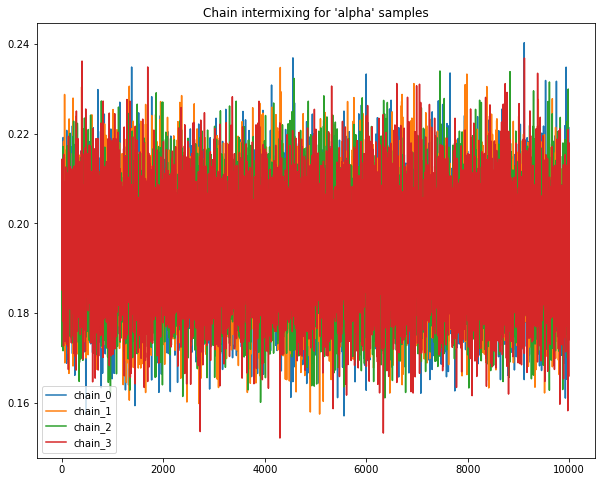

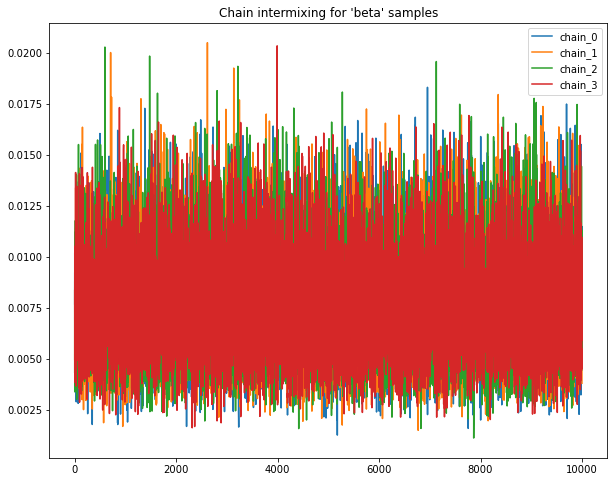


For 'model_Uniform_b'


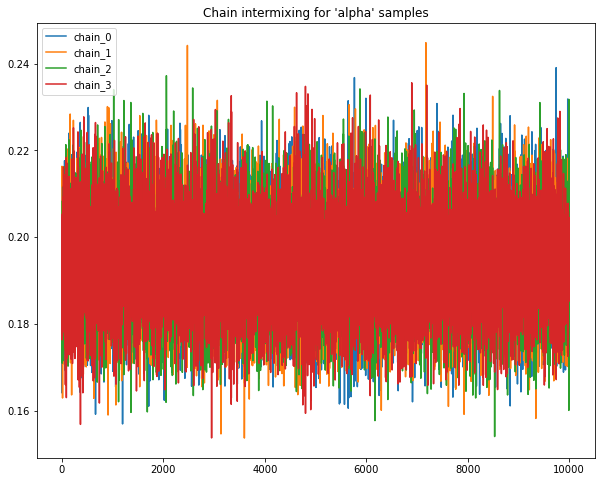

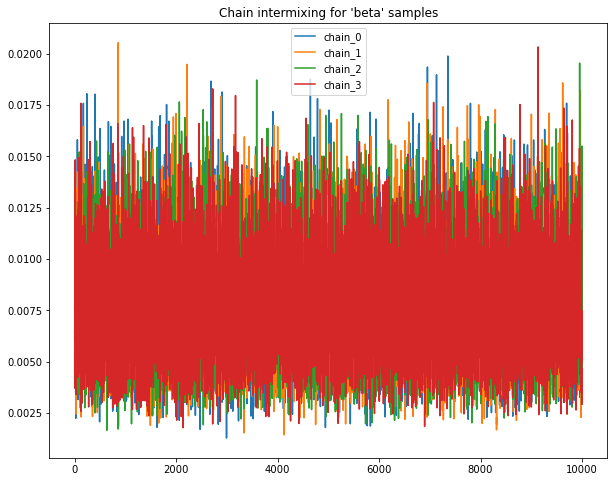

In [12]:
print("For 'model_HalfNormal_a'")    
base.plot_chains(beta_chain_matrix_df_A)


print("\nFor 'model_Uniform_b'")    
base.plot_chains(beta_chain_matrix_df_B)


In [13]:
for chain, samples in hmc_sample_chains_a.items():
    print("____\nFor model_HalfNormal_a %s"%chain)    
    samples= dict(map(lambda param: (param, torch.tensor(samples.get(param))), samples.keys()))# np array to tensors
    print(chain, "Sample count: ", len(samples["alpha"]))
    print("Alpha Q(0.5) :%s | Beta Q(0.5) :%s"%(torch.quantile(samples["alpha"], 0.5), torch.quantile(samples["beta"], 0.5)))

print("%s\n%s"%("_"*60, "_"*60))

for chain, samples in hmc_sample_chains_b.items():
    print("____\nFor model_Uniform_b %s"%chain)    
    samples= dict(map(lambda param: (param, torch.tensor(samples.get(param))), samples.keys()))# np array to tensors
    print(chain, "Sample count: ", len(samples["alpha"]))
    print("Alpha Q(0.5) :%s | Beta Q(0.5) :%s"%(torch.quantile(samples["alpha"], 0.5), torch.quantile(samples["beta"], 0.5)))


____
For model_HalfNormal_a chain_0
chain_0 Sample count:  10000
Alpha Q(0.5) :tensor(0.1936) | Beta Q(0.5) :tensor(0.0073)
____
For model_HalfNormal_a chain_1
chain_1 Sample count:  10000
Alpha Q(0.5) :tensor(0.1938) | Beta Q(0.5) :tensor(0.0073)
____
For model_HalfNormal_a chain_2
chain_2 Sample count:  10000
Alpha Q(0.5) :tensor(0.1937) | Beta Q(0.5) :tensor(0.0073)
____
For model_HalfNormal_a chain_3
chain_3 Sample count:  10000
Alpha Q(0.5) :tensor(0.1935) | Beta Q(0.5) :tensor(0.0073)
____________________________________________________________
____________________________________________________________
____
For model_Uniform_b chain_0
chain_0 Sample count:  10000
Alpha Q(0.5) :tensor(0.1938) | Beta Q(0.5) :tensor(0.0073)
____
For model_Uniform_b chain_1
chain_1 Sample count:  10000
Alpha Q(0.5) :tensor(0.1935) | Beta Q(0.5) :tensor(0.0074)
____
For model_Uniform_b chain_2
chain_2 Sample count:  10000
Alpha Q(0.5) :tensor(0.1934) | Beta Q(0.5) :tensor(0.0073)
____
For model_Unif

In [14]:
for chain in hmc_sample_chains_a.keys():
    print("____\nFor 'model_HalfNormal_a' & 'model_Uniform_b' %s"%chain)
    chain_list= list(hmc_sample_chains_a[chain].values())
    chain_list.extend(list(hmc_sample_chains_b[chain].values()))
    title= "parameter distribution for : %s"%(chain)
    fig = ff.create_distplot(chain_list, ["alpha_a", "beta_a", "alpha_b", "beta_b"])
    fig.update_layout(title=title, xaxis_title="parameter values", yaxis_title="density", legend_title="parameters")
    fig.show()
    break

____
For 'model_HalfNormal_a' & 'model_Uniform_b' chain_0


#### Auto-correlation plots for sample chains with `HalfNormal` priors

In [15]:

base.autocorrelation_plots(beta_chain_matrix_df_A)


RadioButtons(description='Parameters:', options=('alpha', 'beta'), value='alpha')

SelectMultiple(description='Select Chains', index=(1,), options=('chain_0', 'chain_1', 'chain_2', 'chain_3'), …

Output()

#### Auto-correlation plots for sample chains with `Uniform` priors

In [16]:

base.autocorrelation_plots(beta_chain_matrix_df_B)


RadioButtons(description='Parameters:', options=('alpha', 'beta'), value='alpha')

SelectMultiple(description='Select Chains', index=(1,), options=('chain_0', 'chain_1', 'chain_2', 'chain_3'), …

Output()

For `alpha`, `thining factor` for `chain_0` is 3, `chain_1` is 3, `chain_2` is 3, `chain_3` is 3

for `beta`, `thinin factor` for `chain_0` is 3, `chain_1` is 3, `chain_2` is 3, `chain_3` is 3



#### Pruning chains from model with `HalfNormal` priors

In [17]:
thining_dict_a = {"chain_0": {"alpha":3, "beta":3}, "chain_1": {"alpha":3, "beta":3}, 
                "chain_2": {"alpha":3, "beta":3}, "chain_3": {"alpha":3, "beta":3}}

pruned_hmc_sample_chains_a = base.prune_hmc_samples(hmc_sample_chains_a, thining_dict_a)


-------------------------
Original sample counts for 'chain_0' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_0' parameters: {'alpha': 3, 'beta': 3} 
Post thining sample counts for 'chain_0' parameters: {'alpha': (3333,), 'beta': (3333,)}


-------------------------
Original sample counts for 'chain_1' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_1' parameters: {'alpha': 3, 'beta': 3} 
Post thining sample counts for 'chain_1' parameters: {'alpha': (3333,), 'beta': (3333,)}


-------------------------
Original sample counts for 'chain_2' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_2' parameters: {'alpha': 3, 'beta': 3} 
Post thining sample counts for 'chain_2' parameters: {'alpha': (3333,), 'beta': (3333,)}


-------------------------
Original sample counts for 'chain_3' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_3' parameters: {'alpha': 3, 'beta': 3} 
Pos

#### Pruning chains from model with `Uniform` priors

In [18]:
thining_dict_b = {"chain_0": {"alpha":3, "beta":3}, "chain_1": {"alpha":3, "beta":3}, 
                "chain_2": {"alpha":3, "beta":3}, "chain_3": {"alpha":3, "beta":3}}

pruned_hmc_sample_chains_b = base.prune_hmc_samples(hmc_sample_chains_b, thining_dict_b)


-------------------------
Original sample counts for 'chain_0' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_0' parameters: {'alpha': 3, 'beta': 3} 
Post thining sample counts for 'chain_0' parameters: {'alpha': (3333,), 'beta': (3333,)}


-------------------------
Original sample counts for 'chain_1' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_1' parameters: {'alpha': 3, 'beta': 3} 
Post thining sample counts for 'chain_1' parameters: {'alpha': (3333,), 'beta': (3333,)}


-------------------------
Original sample counts for 'chain_2' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_2' parameters: {'alpha': 3, 'beta': 3} 
Post thining sample counts for 'chain_2' parameters: {'alpha': (3333,), 'beta': (3333,)}


-------------------------
Original sample counts for 'chain_3' parameters: {'alpha': (10000,), 'beta': (10000,)}

Thining factors for 'chain_3' parameters: {'alpha': 3, 'beta': 3} 
Pos

#### Gelman-Rubin statistic for chains with `HalfNormal` priors

In [19]:

grubin_values_a = base.gelman_rubin_stats(pruned_hmc_sample_chains_a)



Gelmen-rubin for 'param' alpha all chains is: 0.9997

Gelmen-rubin for 'param' beta all chains is: 0.9998


#### Gelman-Rubin statistic for chains with `Uniform` priors

In [20]:

grubin_values_b = base.gelman_rubin_stats(pruned_hmc_sample_chains_b)



Gelmen-rubin for 'param' alpha all chains is: 0.9998

Gelmen-rubin for 'param' beta all chains is: 0.9997


In [21]:
# Following diagnostic table is for Un-pruned chains from sampler with Normal prior.

base.get_chain_diagnostics(hmc_chain_diagnostics_a)


acceptance rate divergences  metric_values
parameters chain   metric                                            
beta       chain_0 n_eff            0.9786          []    8831.168945
                   r_hat            0.9786          []       1.000172
           chain_1 n_eff            0.9537          []    9585.940430
                   r_hat            0.9537          []       1.000065
           chain_2 n_eff            0.9817          []    8345.361328
                   r_hat            0.9817          []       1.000330
           chain_3 n_eff            0.9847          []    6782.570312
                   r_hat            0.9847          []       1.000187
alpha      chain_0 n_eff            0.9786          []    8051.313965
                   r_hat            0.9786          []       0.999901
           chain_1 n_eff            0.9537          []    9528.405273
                   r_hat            0.9537          []       0.999907
           chain_2 n_eff            0.9817          []    8036.001465
                   r_hat            0.9817          []       0.999900
           chain_3 n_eff            0.9847          []    7825.492676
                   r_hat            0.9847          []       0.999914

In [22]:
# Following diagnostic table is for Un-pruned chains from sampler with Uniform prior.

base.get_chain_diagnostics(hmc_chain_diagnostics_b)


acceptance rate divergences  metric_values
parameters chain   metric                                            
beta       chain_0 n_eff            0.9862          []    7684.417480
                   r_hat            0.9862          []       0.999911
           chain_1 n_eff            0.9871          []    7636.355957
                   r_hat            0.9871          []       0.999976
           chain_2 n_eff            0.9802          []    8455.205078
                   r_hat            0.9802          []       0.999950
           chain_3 n_eff            0.9672          []    9850.635742
                   r_hat            0.9672          []       0.999903
alpha      chain_0 n_eff            0.9862          []    6379.882324
                   r_hat            0.9862          []       0.999947
           chain_1 n_eff            0.9871          []    6650.887207
                   r_hat            0.9871          []       0.999963
           chain_2 n_eff            0.9802          []    8293.966797
                   r_hat            0.9802          []       0.999906
           chain_3 n_eff            0.9672          []   10098.281250
                   r_hat            0.9672          []       1.000036

#### Descriptive summaries

Following outputs the summary of required statistics such as `"mean", "std", "Q(0.25)", "Q(0.50)", "Q(0.75)"`, select names of statistic metric from given list to view values

#### Summary for model chains with `HalfNormal` priors

In [23]:
#chain results Pruned after ACF plots

beta_chain_matrix_df_A = pd.DataFrame(pruned_hmc_sample_chains_a)

base.summary(beta_chain_matrix_df_A)


SelectionSlider(continuous_update=False, description='Slide to', options=('View 1', 'View 2', 'Clear'), value=…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

#### Summary for model chains with `Uniform` priors

In [24]:
#chain results Pruned after ACF plots

beta_chain_matrix_df_B = pd.DataFrame(pruned_hmc_sample_chains_b)

base.summary(beta_chain_matrix_df_B)


SelectionSlider(continuous_update=False, description='Slide to', options=('View 1', 'View 2', 'Clear'), value=…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

We can also report the 5-point Summary Statistics (mean, Q1-Q4, Std, ) as tabular data per chain and save the dataframe

#### 5-point Summary Statistics for model chains with `HalfNormal` priors

In [25]:
fit_df_A = pd.DataFrame()
for chain, values in pruned_hmc_sample_chains_a.items():
    param_df = pd.DataFrame(values)
    param_df["chain"]= chain
    fit_df_A= pd.concat([fit_df_A, param_df], axis=0)

base.save_parameter_chain_dataframe(fit_df_A, "data/dogs_classification_hmc_samples_1A.csv")

Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_classification_hmc_samples_1A.csv'


#### 5-point Summary Statistics for model chains with `Uniform` priors

In [26]:
fit_df_B = pd.DataFrame()
for chain, values in pruned_hmc_sample_chains_b.items():
    param_df = pd.DataFrame(values)
    param_df["chain"]= chain
    fit_df_B= pd.concat([fit_df_B, param_df], axis=0)

base.save_parameter_chain_dataframe(fit_df_B, "data/dogs_classification_hmc_samples_1B.csv")

Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_classification_hmc_samples_1B.csv'


Use following button to upload:

* `"data/dogs_classification_hmc_samples_1A.csv"` as `'fit_df_A'`

* `"data/dogs_classification_hmc_samples_1B.csv"` as `'fit_df_B'`

In [27]:
# Use following to load data once the results from pyro sampling operation are saved offline
load_button= base.build_upload_button()

FileUpload(value={}, accept='.csv', button_style='info', description='Upload')

In [28]:
# Use following to load data once the results from pyro sampling operation are saved offline

if load_button.value:
    fit_df_A = base.load_parameter_chain_dataframe(load_button)#Load "data/dogs_classification_hmc_samples_1A.csv"
#     fit_df_B= base.load_parameter_chain_dataframe(load_button)#Load "data/dogs_classification_hmc_samples_1B.csv"

Following outputs the similar summary of required statistics such as `"mean", "std", "Q(0.25)", "Q(0.50)", "Q(0.75)"`, but in a slightly different format, given a list of statistic names

#### Summary for model chains with `HalfNormal` priors

In [29]:

base.summary(fit_df_A, layout =2)


SelectionSlider(continuous_update=False, description='Slide to', options=('View 1', 'View 2', 'Clear'), value=…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

#### Summary for model chains with `Uniform` priors

In [30]:

base.summary(fit_df_B, layout =2)


SelectionSlider(continuous_update=False, description='Slide to', index=2, options=('View 1', 'View 2', 'Clear'…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

Following plots sampled parameters values as Boxplots with `M parameters` side by side on x axis for each of the `N chains`

Pass the list of `M parameters` and list of `N chains`, with `plot_interactive` as `True or False` to choose between _Plotly_ or _Seaborn_

In [31]:
parameters= ["alpha", "beta"]# All parameters for given model
chains= fit_df_A["chain"].unique()# Number of chains sampled for given model

#### Boxplot for model chains with `HalfNormal` priors

In [32]:
# Use plot_interactive=False for Normal seaborn plots offline

base.plot_parameters_for_n_chains(fit_df_A, chains=['chain_0', 'chain_1', 'chain_2', 'chain_3'], parameters=parameters, plot_interactive=True)



#### Boxplot for model chains with `Uniform` priors

In [33]:
# Use plot_interactive=False for Normal seaborn plots offline

base.plot_parameters_for_n_chains(fit_df_B, chains=['chain_0', 'chain_1', 'chain_2', 'chain_3'], parameters=parameters, plot_interactive=True)



Following plots the `joint distribution` of `pair of each parameter` sampled values for all chains with `HalfNormal` priors.


Pyro -- alpha Vs. beta


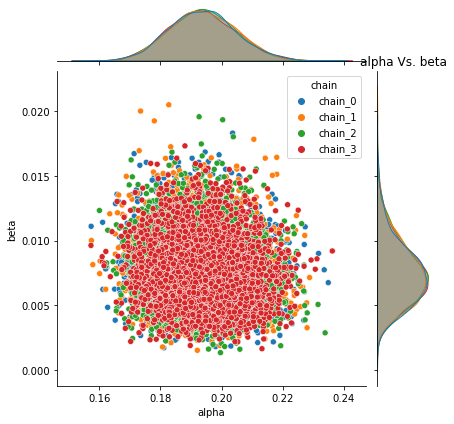

In [34]:

base.plot_joint_distribution(fit_df_A, parameters)


Following plots the `joint distribution` of `pair of each parameter` sampled values for all chains with `Uniform` priors.


Pyro -- alpha Vs. beta


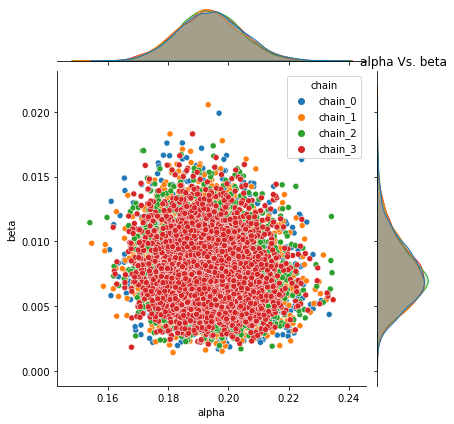

In [35]:

base.plot_joint_distribution(fit_df_B, parameters)


Following plots the `Pairplot distribution` of each parameter with every other parameter's sampled values for all chains with `HalfNormal` priors

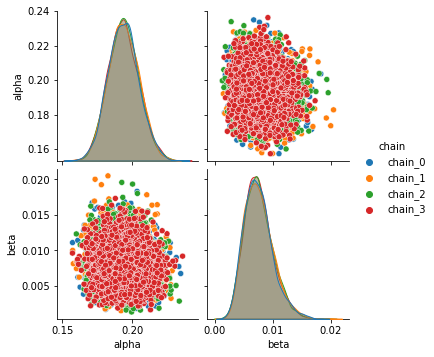

In [36]:
sns.pairplot(data=fit_df_A, hue= "chain");

Following plots the `Pairplot distribution` of each parameter with every other parameter's sampled values for all chains with `Uniform` priors

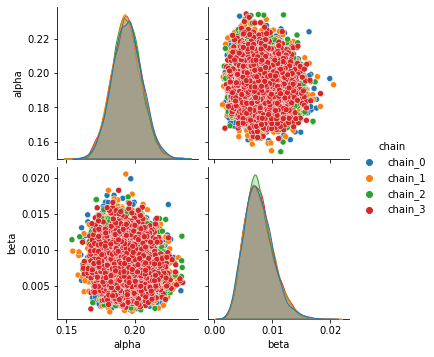

In [37]:
sns.pairplot(data=fit_df_B, hue= "chain");

Nothing unsual seems to be happennning. 

- All chains are mixing well (G-R statstics is close to 1). 
- ACF of the chains decays rapidly. 
- Both Half-normal and Uniform are giving similar results
- Joint distribution of $\alpha, \beta$ has no strong correlation, and consistent across chains.

But, let us do Posterior Predictive checks

### 6. Sensitivity Analysis

Posterior Predictive Checking (PPE) helps examine the fit of a model to real data, as the parameter drawn for simulating conditions & regions of interests come from the posterior distribution. While PPE incorporates model uncertainly (by averaring over all possible models), we take a simpler route to begin with, which is to, sample the $\alpha, \beta$ pair that is very plausible in the posterior (eg. the poster means), and simulate data from under this particular generative model.

In particular, just like the Prior Predictive Check, we are intereted in the posterior expected value of a Dog getting shocked. This quantity can be estimated by the Monte Carlo average:


$ E_{P(\alpha,\beta|y_j)}[\hat{y}] $


$\,\,\,\, = E_{P(\alpha,\beta|y_j)}[\exp(-(\alpha X_{a} + \beta X_{s}))))]$

$\,\,\,\, \approx   \frac{1}{B}\sum_{t=1}^{T}\exp(-(\alpha_t X_{a} + \beta_t X_{s})))))$
<br>
where $\alpha_t, \beta_t$ are the t-th posterior sample in the MCMC chain.

In [38]:
# With priors & posteriros
posterior_parameters_pairs_a = pruned_hmc_sample_chains_a.get('chain_0')

posterior_parameters_pairs_b = pruned_hmc_sample_chains_b.get('chain_0')

original_plus_simulated_data_posterior = base.simulate_observations_given_prior_posterior_pairs(dogs_data["Y"], 
                                                                                                num_dogs=30, num_trials=24, activation_type= "exp",
                                                                                                prior_simulations= original_plus_simulated_prior_data, 
                                                                                                model_halfnormal_a= posterior_parameters_pairs_a,
                                                                                                model_uniform_b= posterior_parameters_pairs_b)


___________

For model 'model_halfnormal_a' posterior
total samples count: 3333  sample example:  [(0.20342435, 0.0077009345), (0.19606128, 0.008753207)]
Total execution time: 239.15115213394165

Number of datasets/posterior pairs generated: 3333
Shape of data simulated from posterior for model 'model_halfnormal_a' : (25,)
___________

For model 'model_uniform_b' posterior
total samples count: 3333  sample example:  [(0.2120226, 0.0045217406), (0.194261, 0.008113162)]
Total execution time: 236.89282298088074

Number of datasets/posterior pairs generated: 3333
Shape of data simulated from posterior for model 'model_uniform_b' : (25,)
Respective shape of original data: (25,) and concatenated arrays of data simulated for different priors/posteriors: (5, 25)

_______________________________________________________
______________________________________________________________________
Here 'Dog_1' corresponds to observations simulated from posterior of 'model_halfnormal_a', 'Dog_2' correspo

In [47]:
original_plus_simulated_data_posterior_df= pd.DataFrame(original_plus_simulated_data_posterior.T, 
                                                     columns=["Dog_%s"%(idx+1) for idx in range(len(original_plus_simulated_data_posterior))])


base.save_parameter_chain_dataframe(original_plus_simulated_data_posterior_df, 
                                    "data/dogs_original_plus_simulated_data_model_1ab.csv")

Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_original_plus_simulated_data_model_1ab.csv'


Something weird happenning. The posterior expected value of a Dog getting shocked is larger than the prior and also the observed data.

We anticipate that the posterior expected value to lie between data and prior, some sort of a weighed average of prior and data. Why is this happenning? Let us investiage.

Can we compute the posterior, and prior expectations analytically to prove the point? Since sampling distribution and prior for $\alpha, \beta$ are not conjugate, in general, we can not analytically compute it. At least, it is not trivial. But we will simply the situation, just to gain insights into the problem.

Say, we observed $X_a=1, X_s=0, y=1$, and also consider uniform priors $U(0,b), b>0$ for both $\alpha,\beta$.

Then, $\pi = \exp(-\alpha)$ with $\alpha \sim U(0,b)$. Earlier, we calculated the _prior expected value_ analtucally as $E_{pr}[\hat{y}] = (1-\exp(-b))/b$

Likewise, _prior expected value_ can be caluclated, at the second trial. But before that, we need to calculate the posterior distribution. Assume that, we observed $y=1$. Then,

$P(\alpha,\beta | y=1, X_a=1, X_s=0) \propto \exp(-\alpha) I(0,b)$
$\implies$
$E_{po}(\hat{y} | y=1, X_a=1, X_s=0)= \frac{1}{1-\exp(-b)}\int_0^{b} \exp(-2\alpha) = \frac{0.5(1-\exp(-2b))}{1-\exp(-b)}$

Since we know $y=1$, hypothesis is $ \frac{0.5(1-\exp(-2b))}{1-\exp(-b)} \le 1-\exp(-b)$. Let us verify if this inquality is true. At least for $b >> 1$ large, say $b=10, \exp(-b) \approx 0$. Therefore, for flat prior, $ 0.5 \le 1$, which is true. We will not prove but, we anticipate the same behaviour being true for any observed data. Let us verify the asymptotic behaviour a little bit.

Consider that, we have data about all dogs upto time $t$, and there are $n$ Dogs. The likelihood is:

$L(y | \alpha,\beta) = \prod_{i=1}^{n} \pi^{y_i} (1-\pi_i)^{1-y_i} $, with $\pi_i = \exp(-(x_{i,a}^t \alpha + x_{i,s}^t \beta)$, $x_{i,s}(t), x_{i,a}(t)$ are cumulative avoidances and shocks of the i-th dog, upto time $t$.  We divide the responses into two sets: Dogs that are shocked and that are not in to $S$ and $S^c$ respectively.

Then likelihood simplifies to:

$$L(y | \alpha,\beta) = \prod_{i\in S^c} \pi_i \prod_{i\in S} (1-\pi_i) $$

It can be further simplified by absorbing few more summary statistics into it as:

$$L(y | \alpha,\beta) = \exp(-(\alpha N_{a} + \beta N_s)) (1-\exp(-(\alpha M_{a} + \beta M_s))) $$

where $N_a = \sum_{j=1, i \in S^c}^{t} x_{i,a}(j) $. Others can be defined similarly.

Now the posterior at time t, can be defined as follows:
$$P(\alpha, \beta | data) \propto \frac{1}{b^2} L(y | \alpha,\beta) I(\alpha,\beta > 0) $$
which turns out to be, after some algebra,
$$P(\alpha, \beta | data) = \frac{1}{Z} \exp(-(\alpha N_a + \beta N_s)) (1-\exp(-(\alpha M_a + \beta M_s))) I(\alpha,\beta > 0) $$
where the normalization constant  $Z$ is  $$\frac{1}{(1-\exp(-bN_a))(1-\exp(-bN_s))} - \frac{1}{(1-\exp(-b(N_a+M_a))(1-\exp(-b(N_s+M_s))}$$

The expected response under the above posterior is:
$$E_{P(\alpha, \beta | data)}[\hat{y}] = E[\exp(-(\alpha x_a + \beta x_s))] $$ for some given $x_a, x_s$. 
After some algebra, we get

$$E_{P(\alpha, \beta | data)}[\hat{y}] = \frac{(1-e^{-b(N_a+N_s+x_a+x_s})(1-e^{-b(N_a+N_s+M_a+M_s+x_a+x_s})}{Z(N_s+x_a)(N_s+x_s)(x_a+N_a+M_a)(x_s+N_s+M_s)}. $$

Even when the data shows strong tendency for Dogs to not learn from shocks, i.e, $|S| >> |S^c|$. Asymptotically,  $\lim_{N_s \to \infty} E_{P(\alpha, \beta | data)}[\hat{y}] = 0$. We suspect that, the rate is much slower than the prior. Consequently, the poster expected value will sit above the prior but above the empirical average, at the last instance.


Now we detected a problem. What could be happenning? Few plausible explanations:

- Recall that the prior was very informative (very strong prior on Dogs gets shocked) but data is far from it. There is a misfit between the data and prior. 
- Even the posterior, it appears, is strongly influenced by the characterization.
- Upon inspection, realized that the `pyro` sampler draws samples around 0. Which in this case means, that the initilization is very far from the prior and the posterior. Consequently, the posterior landscape could be very rugged, NUTS has to try very hard to get of this sampling zone
- Notice that the prior and posterior asymptotic analysis was carried out the last observation. But, the joint likelihood is defined over the entire trails horizon. As a result, while posterior expectation at an intermediate trials has already seen the future data (more like smoothening). Consequently, it may be possible that, the posterior and prior wont agree becuase of the data-leakage.

There are two take-ways from this analysis. 

- We need to set priots such that the intitializations, as preferred by `pyro`, are around zero. The priors need to be caliberated in the model such that, the most plausible values or the central region should be around zero region. We will offset the prior into a more negative region, and consider its effect on the sampler.
- The sampling distribution, in paritcular, the `log` link function, seems to be a poor choice. Instead, we could use a `sigmoid` link function. We will analyze the same data, with a `sigmoid` link function in the chapter 02.

### 7. Model Comparison

Ideally, we would not have proceeded with model comparison, as we originally envisioned, due to poor fit between model and data. However, for pedagogic reasons, and comppleness sake, we will do model comparison.

More often than not, there may be many plausible models that can explain the data. Sometime, the modeling choice is based on _domain knowledge_. Sometime it is out of comptational conveninece. Latter is the case with the choice of priors. One way to consider different models is by eliciting different prior distributions. 

As long as the sampling distribtion is same, one can use Deviance Information Criterion (DIC) to guide model comparison.

#### Deviance Information Criterion

DIC is computed as follows
<Br>

$D(\alpha,\beta) = -2\ \sum_{i=1}^{n} \log P\ (y_{i}\ /\ \alpha,\beta)$

$\log P\ (y_{i}\ /\ \alpha,\beta)$ is the log likehood of shocks/avoidances observed given parameter $\alpha,\beta$, this expression expands as follows:

$$D(\alpha,\beta) = -2\ \sum_{i=1}^{30}[ y_{i}\ (\alpha Xa_{i}\ +\beta\ Xs_{i}) + \ (1-y_{i})\log\ (1\ -\ e^{(\alpha Xa_{i}\ +\beta\ Xs_{i})})]$$

<Br>
Using $D(\alpha,\beta)$ to Compute DIC
<Br>

$\overline D(\alpha,\beta) = \frac{1}{T} \sum_{t=1}^{T} D(\alpha,\beta)$

$\overline \alpha = \frac{1}{T} \sum_{t=1}^{T}\alpha_{t}\\$
$\overline \beta = \frac{1}{T} \sum_{t=1}^{T}\beta_{t}$

$D(\overline\alpha,\overline\beta) = -2\ \sum_{i=1}^{30}[ y_{i}\ (\overline\alpha Xa_{i}\ +\overline\beta\ Xs_{i}) + \ (1-y_{i})\log\ (1\ -\ e^{(\overline\alpha Xa_{i}\ +\overline\beta\ Xs_{i})})]$

<Br>
Therefore finally
<Br>

$DIC\ =\ 2\ \overline D(\alpha,\beta)\ -\ D(\overline\alpha,\overline\beta)$

<Br>
<Br>

<Br>
Following method computes deviance value given parameters `alpha & beta`
<Br>

In [36]:
#launch docstring for calculate_deviance_given_param

#launch docstring for calculate_mean_deviance


<Br>

Following method computes `deviance information criterion` for a given bayesian model & chains of sampled parameters `alpha & beta`

<Br>

In [37]:
#launch docstring for DIC

#launch docstring for compare_DICs_given_model

Sample an alternate model with different priors

The alternate model is defined in the same manner using Pyro as per the following expression of generative model for this dataset, just with modification of prior distribution to `Uniform` rather than `Normal` as follows:

Instead of considering Normal priors of $\alpha$ and $\beta$, we consider uniform priors, i.e.,
$prior\ \alpha$ ~ $U(0, 10.)$,  $\beta$ ~ $U(0, 10.)$

In _Section 5._, we already sampled such model to obtain posterior chains as `pruned_hmc_sample_chains_b` which we shall use for computing DIC in cells that follow.

#### Sample chains mixing for Uniform priors
Following plots chains of samples for alpha & beta parameters with uniform priors

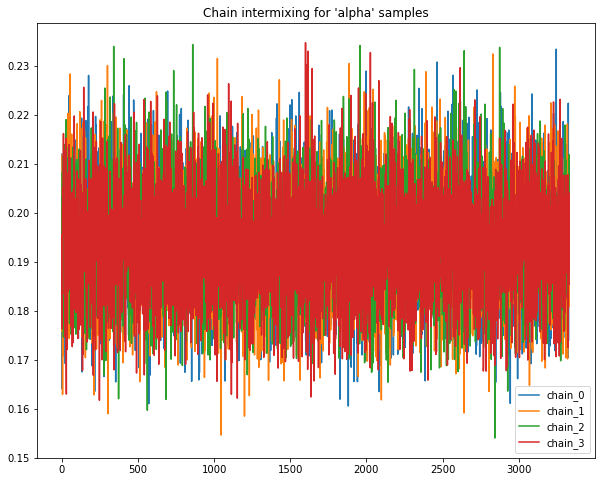

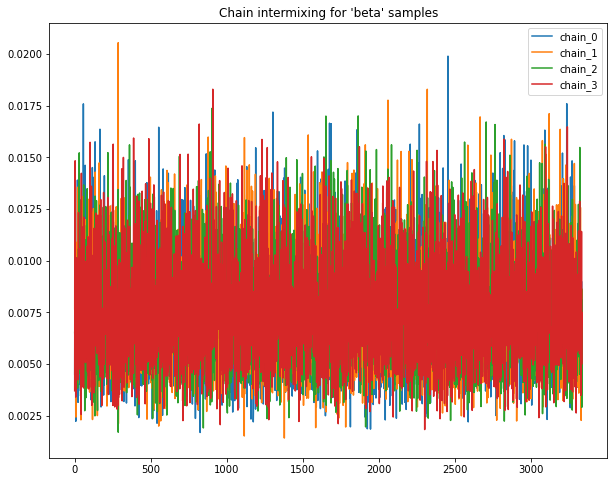

In [60]:

base.plot_chains(pd.DataFrame(pruned_hmc_sample_chains_b))


#### Gelman-Rubin statistic for Uniform priors

In [49]:

grubin_values_uniform = base.gelman_rubin_stats(pruned_hmc_sample_chains_b)



Gelmen-rubin for 'param' alpha all chains is: 0.9998

Gelmen-rubin for 'param' beta all chains is: 0.9997


#### compute & compare `deviance information criterion` for a multiple bayesian models

In [50]:

base.compare_DICs_given_model(x_avoidance, x_shocked, y, Dogs_HalfNormal_prior= pruned_hmc_sample_chains_a, Dogs_uniform_prior= pruned_hmc_sample_chains_b)


______________________________

For model : Dogs_HalfNormal_prior
. . .DIC for chain_0: 715.321
. . .DIC for chain_1: 715.321
. . .DIC for chain_2: 715.321
. . .DIC for chain_3: 715.321

. .Mean Deviance information criterion for all chains: 715.321

______________________________

For model : Dogs_uniform_prior
. . .DIC for chain_0: 715.321
. . .DIC for chain_1: 715.321
. . .DIC for chain_2: 715.321
. . .DIC for chain_3: 715.321

. .Mean Deviance information criterion for all chains: 715.321



The DIC values are very close, so we don't anticipate substantially different fits. This is largely because, both priors are flat. However, if were to follow the rule book, we had to pick a model with the smallest DIC. In this case, both `Normal` Priors & `Uniform` Priors yield identical DIC.

### 8. Inference & Analysis

Alright, we have a model, but so what? The purpose of model building is to use these models as probing devices. That is, using the models can we answer some questions about the reality that these models have abstracted. 


We choose model with Half-Normal Prior, and pick samples from one particular chain of HMC samples say `chain_3`

In [53]:
for chain, samples in pruned_hmc_sample_chains_a.items():
    samples= dict(map(lambda param: (param, torch.tensor(samples.get(param))), samples.keys()))# np array to tensors
    print(chain, "Sample count: ", len(samples["alpha"]))

chain_0 Sample count:  3333
chain_1 Sample count:  3333
chain_2 Sample count:  3333
chain_3 Sample count:  3333


Plot density for parameters from `chain_3` to visualise the spread of sample values from that chain

In [54]:
title= "parameter distribution for : %s"%(chain)
fig = ff.create_distplot(list(map(lambda x:x.numpy(), samples.values())), list(samples.keys()))
fig.update_layout(title=title, xaxis_title="parameter values", yaxis_title="density", legend_title="parameters")
fig.show()

print("Alpha Q(0.5) :%s | Beta Q(0.5) :%s"%(torch.quantile(samples["alpha"], 0.5), torch.quantile(samples["beta"], 0.5)))


Alpha Q(0.5) :tensor(0.1933) | Beta Q(0.5) :tensor(0.0073)


Plot density & contours for both parameters from `chain_3` to visualise the joint distribution & region of interest with `HalfNormal` priors.

In [55]:
#Choosing samples from chain 3
chain_samples_df_A= fit_df_A[fit_df_A["chain"]==chain].copy()# chain is 'chain_3' 

alpha= chain_samples_df_A["alpha"].tolist()
beta= chain_samples_df_A["beta"].tolist()
colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]
fig = ff.create_2d_density(alpha, beta, colorscale=colorscale, hist_color='rgb(255, 255, 150)', point_size=4, title= "Alpha-Beta joint density plot for model with 'HalfNormal' prior")
fig.update_layout( xaxis_title="x (alpha)", yaxis_title="y (beta)")

fig.show()

#### Observations:

On observing the joint distribution of $\alpha, \beta$, we note that $\beta < \alpha$  and $\beta$ is closer to zero. 
Here, $\beta$ can be interpreted as _learning ability_, i.e., the ability of a dog to learn from _shock_ experiences. The increase in number of shocks barely raises the probability of non-avoidance (value of 𝜋𝑗) with little amount. Unless the trials & shocks increase considerably large in progression, it doesn't mellow down well and mostly stays around 0.9.

However, it is not the case with $\alpha, \alpha$ is more positive & farthest from 'zero'. It imparts a significant decline in non-avoidance (𝜋𝑗) even for few instances where dog avoids the shock; therefore $\alpha$ can be interpreted as _retention ability_ i.e., the ability to retain the learning from previous shock experiences.

In [56]:
print(chain_samples_df_A["alpha"].describe(),"\n\n", chain_samples_df_A["beta"].describe())

count    3333.000000
mean        0.193567
std         0.011008
min         0.157281
25%         0.185966
50%         0.193318
75%         0.200985
max         0.236180
Name: alpha, dtype: float64 

 count    3333.000000
mean        0.007543
std         0.002389
min         0.001638
25%         0.005867
50%         0.007336
75%         0.008974
max         0.017314
Name: beta, dtype: float64


From the contour plot above following region in posterior distribution seems highly plausible for parameters:
1. For alpha, `0.18 < alpha < -0.20`
2. For beta `0.005 < beta < 0.008`

Let us look at $\frac{\alpha}{\beta}$ as a proxy to see which of the two (_learning ability_ and _retention_ability) are domimant. 

We are using $\frac{\alpha}{\beta}$ as a probing device to answer that question, and similar quantities can be defined. With MCMC samples available, we can get posterior probabilties of any function of the model parameters (here $\alpha, \beta$. Say, we can be interested in the $E(\frac{\alpha}{\beta})$ or $P(\frac{\alpha}{\beta}>1)$.

The latter quantity can be estimate by the Monte Carlo average as follows:
$P(\frac{\alpha}{\beta}>1) = \frac{1}{n}\sum_{t=1}^{n} I(\alpha > \beta)$, i.e, the fraction of times $\alpha > \beta$.

In [59]:
x1 = chain_samples_df_A["alpha"].to_numpy()
x2 = chain_samples_df_A["beta"].to_numpy()
p = np.mean(x1<x2)
print(p)

0.0


So, the posterior evidence for _retention ability_ outweigting _learning abilty_ is overwhelming. Had the model fit was alright, this is the conclusion we would have drawn.

### 9. Commentary

1. Analyzing this dataset was turned out be more complicated than we originally thought. Very little is known about the data or prior analysis technique. Both WinBUGs and Stan, fell short of providing any reasonable analysis, except providing a code in model. This is hardly useful for a practitioner

2. `pyro`s documentation is very poort. The parametrizations of the distribution has to be made very clear. There is no standard convention for defining the parameters of a distribution. For example, winBUGs, MATLAB, and Wikipedia can all define some distributions differnetly. If not checked carefull, one could be using variance in place of precision.

### 10. Exercises

1. Derive the expected value of Dogs getting shocked under the prior.
2. Derive the expected value of Dogs getting shocked under the posterior.
3. Verify the asymptotic analysis of the prior and posterior predicted responses provided.
3. Use `sigmoid` link function, instead of `exp`, and complete the model specification, and carry out the inference?
4. Instead of modeling the entire trails, consider the data at the last trais. Develop a model to analyze this aggregate data.
5. Devevelop and implement an experiment to validate or invalidate the hypothesis that, under complete data, predicted poster responses at an intermediate trial need to not be sandwitched between data and prior.